# 合并后数据集可视化

按照受试者编号顺序，展示每个受试者一天的血糖-时间序列图。
选取每个受试者数据量最多的一天进行展示。

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from datetime import datetime

# 设置科研绘图风格 (参考 origin_data_plot.ipynb)
plt.style.use('seaborn-v0_8-paper')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 11
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['axes.titlesize'] = 13
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['legend.fontsize'] = 10
plt.rcParams['figure.dpi'] = 100

print("Libraries imported and style set.")

Libraries imported and style set.


In [2]:
# 读取合并后的数据
data_path = 'merged_cgm_data.csv'
print(f"Reading data from: {data_path}")

df = pd.read_csv(data_path)

# 转换时间列
df['time'] = pd.to_datetime(df['time'])

print(f"Data shape: {df.shape}")
print(f"Unique subjects: {df['id'].nunique()}")
df.head()

Reading data from: merged_cgm_data.csv
Data shape: (117570, 5)
Unique subjects: 174


,id,time,gl,age,bmi
0,2,2012-01-01 00:00:00,167.0,42.0,30.0
1,2,2012-01-01 00:05:00,163.0,42.0,30.0
2,2,2012-01-01 00:10:00,158.0,42.0,30.0
3,2,2012-01-01 00:15:00,151.0,42.0,30.0
4,2,2012-01-01 00:20:00,144.0,42.0,30.0


Total subjects to plot: 174


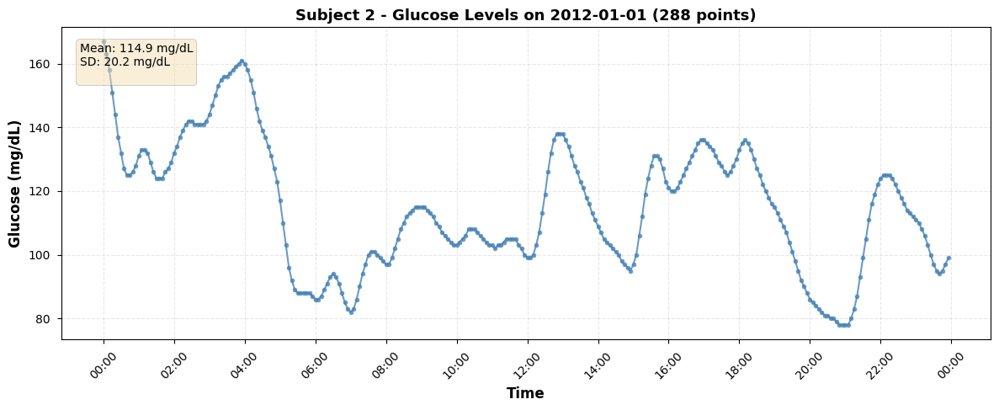

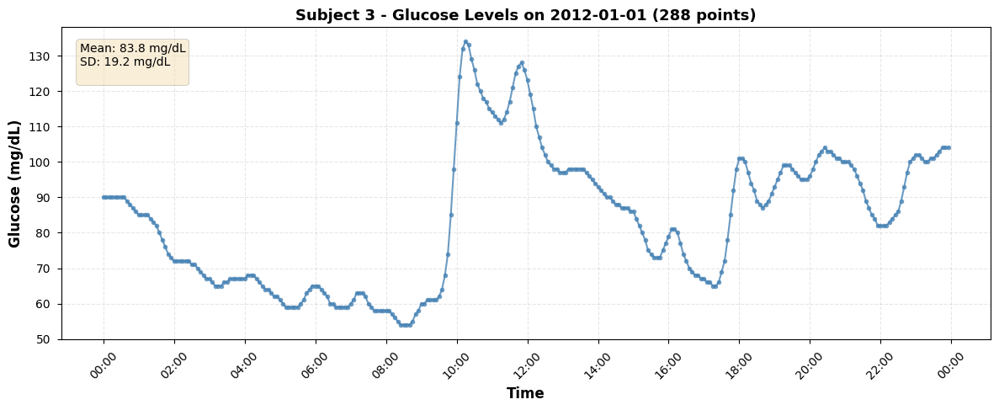

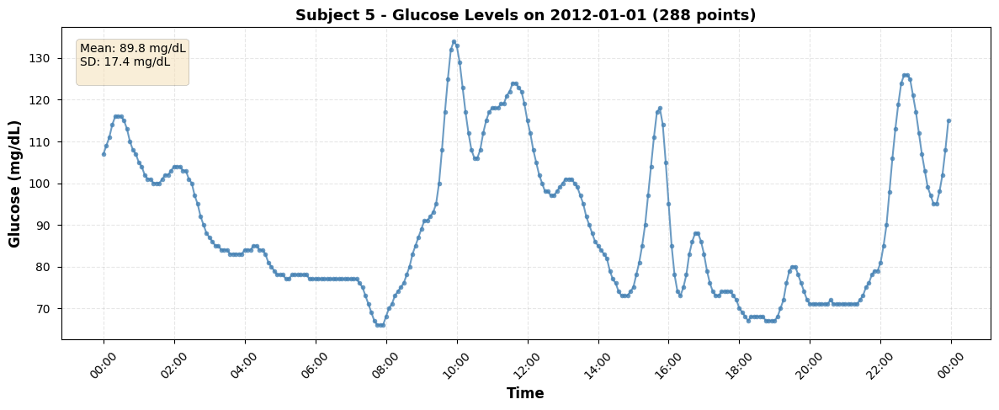

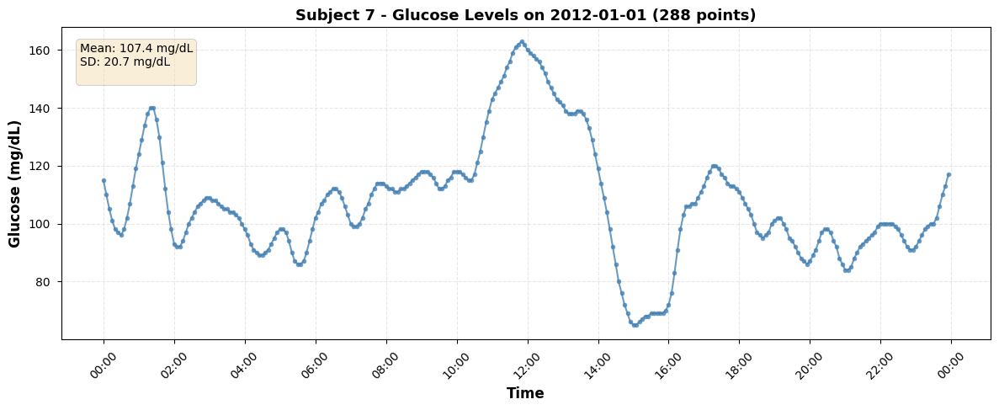

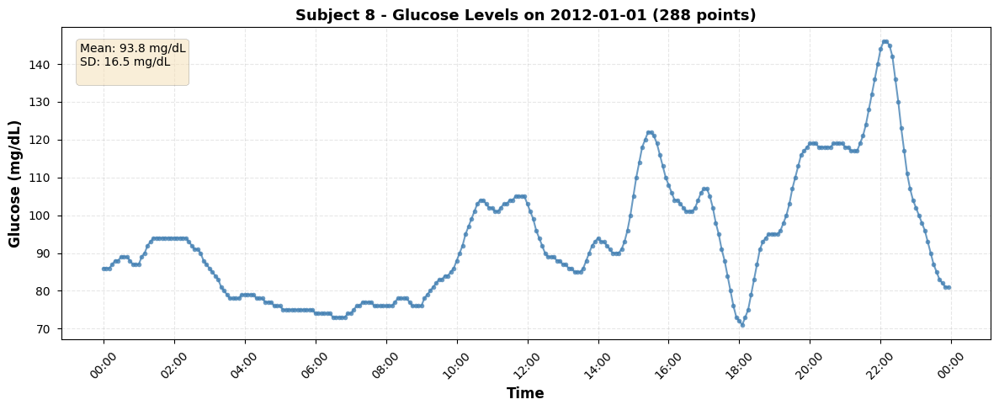

...

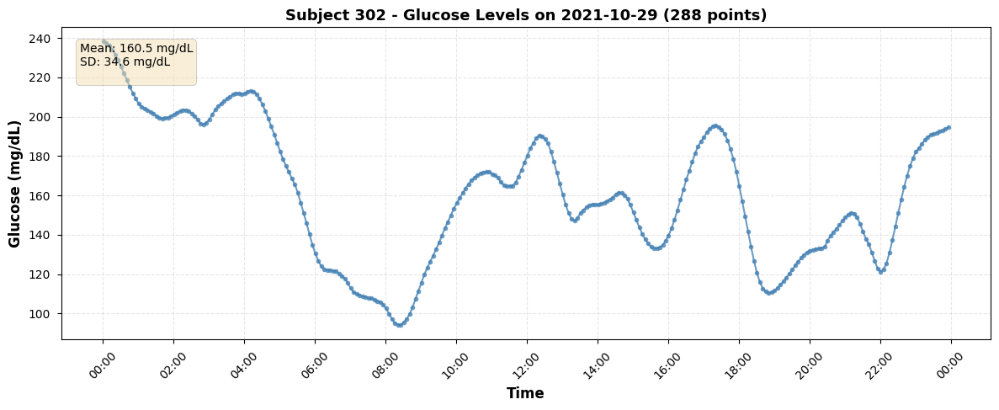

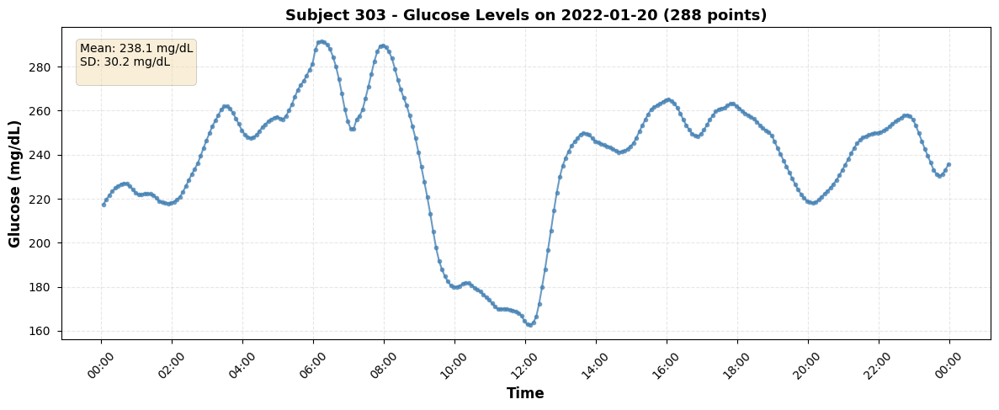

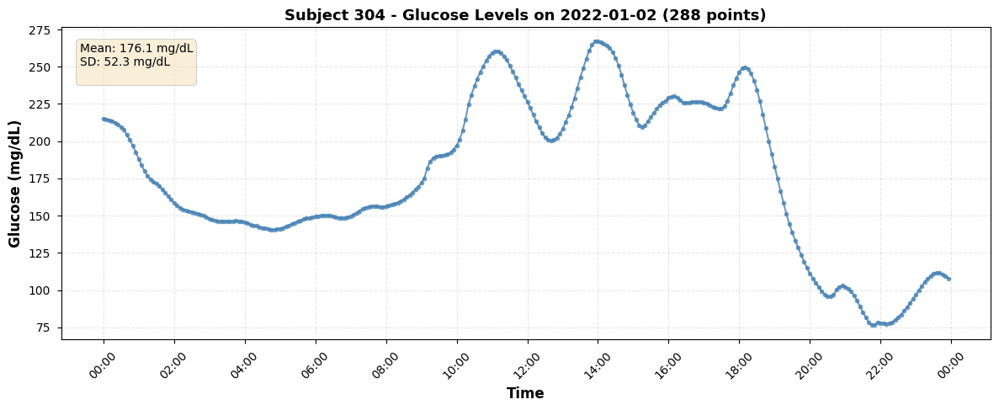

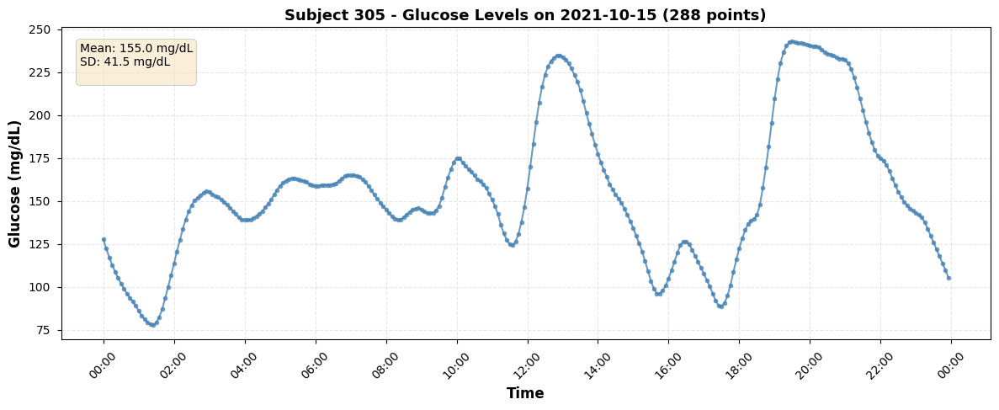

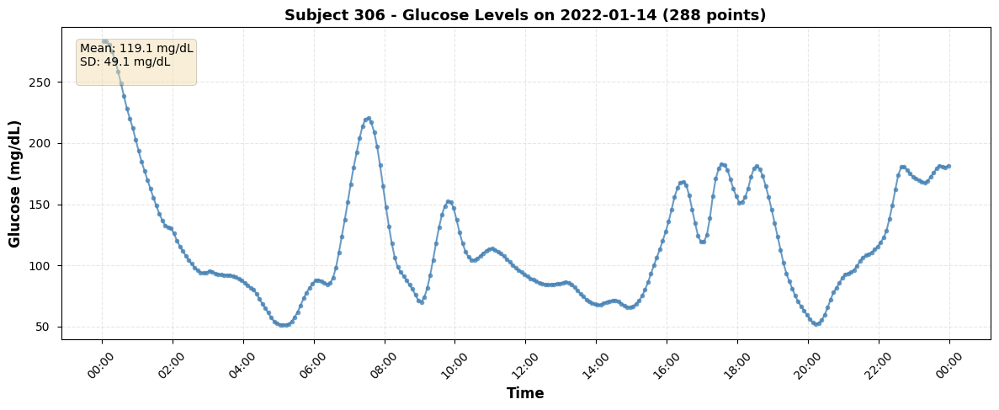

In [3]:
# 绘制每个受试者一天的血糖图
unique_subjects = sorted(df['id'].unique())

print(f"Total subjects to plot: {len(unique_subjects)}")

for subject_id in unique_subjects:
    # 获取该受试者的数据
    subject_data = df[df['id'] == subject_id].copy()
    
    # 提取日期
    subject_data['date'] = subject_data['time'].dt.date
    
    # 找到数据点最多的一天
    date_counts = subject_data['date'].value_counts()
    if len(date_counts) == 0:
        print(f"Subject {subject_id}: No data found.")
        continue
        
    best_date = date_counts.idxmax()
    day_data = subject_data[subject_data['date'] == best_date].sort_values('time')
    
    # 绘图
    plt.figure(figsize=(12, 5))
    
    # 绘制血糖曲线
    plt.plot(day_data['time'], day_data['gl'], marker='o', markersize=4, 
             linestyle='-', linewidth=1.5, alpha=0.8, color='steelblue', label='Glucose Level')
    
    # 设置标题和标签
    plt.title(f'Subject {subject_id} - Glucose Levels on {best_date} ({len(day_data)} points)', fontweight='bold')
    plt.xlabel('Time', fontweight='bold')
    plt.ylabel('Glucose (mg/dL)', fontweight='bold')
    plt.grid(True, alpha=0.3, linestyle='--')
    
    # 格式化x轴时间显示
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    plt.gca().xaxis.set_major_locator(mdates.HourLocator(interval=2))
    plt.xticks(rotation=45)
    
    # 添加统计信息
    mean_gl = day_data['gl'].mean()
    std_gl = day_data['gl'].std()
    min_gl = day_data['gl'].min()
    max_gl = day_data['gl'].max()
    
    stats_text = (f'Mean: {mean_gl:.1f} mg/dL\n'
                  f'SD: {std_gl:.1f} mg/dL\n')
    
    plt.text(0.02, 0.95, stats_text, 
             transform=plt.gca().transAxes, fontsize=10,
             verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.show()